## Training and Evaluating Generative Adversarial Network on Generated MCMC Samples

This notebook contains examples of the following:
1. Train a Wasserstein GAN on MCMC Sampling results
2. Use the train model to generate samples from the learned distribution
3. Evalute the trained models on several distribution metrics.

#### Enviornment Setup

You may refer to reqirement.txt for specific package versions.

In [1]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pickle
import wandb

from process_data import *
from generative_model import WGAN_SIMPLE

### Model Training

#### Model inputs

Lets define some inputs for the model training:
- dataroot - the path to the root of the dataset
- savepath - save path for trianed model check points
- workers - the number of worker threads for loading the data with the DataLoader
- batch_size - the batch size used in training. 
- num_epochs - number of training epochs to run. Training for longer will probably lead to better results but will also take much longer
- lr - learning rate for training.
- beta1 - beta1 hyperparameter for Adam optimizers.

In [ ]:
dataroot = './data/Rayleigh_P30_downsampled_flat_extended.csv'
savepath = "./model"
workers = 1
batch_size = 128
num_epochs = 200
lr = 0.0002
beta1 = 0.5
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")

In [ ]:
# configure parameter for parameter logging on wandb.ai
config = dict(
        learning_rate=lr,
        momentum=beta1,
        training_epoch=num_epochs,
        batch_size = batch_size,
        architecture="WGAN_MLP",
        data="Rayleigh P30 last 3 runs",
        device = device
    )
wandb.init(project="mcmc-wgan-simple",
               notes = "hyperparameter tuning",
               config=config)

#### Load the data and construct pytorch dataloader

Pytorch provides easy-to-use API for loading custom dataset for automatic batch data loading that faciliates Neural Network batch optimization. For more details, please refer to process_data.py or [Pytorch's official tutorial](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html).

In [7]:
data = np.genfromtxt('./data/Rayleigh_P30_downsampled_flat_extended.csv', delimiter=',', skip_header=True)

Standarize data to range [-1,1], and save the data's mean and standard deviation of later inversion.

In [10]:
recompute_scaler = True
if recompute_scaler:
    scaler = MinMaxScaler((1,data.shape[1]))
    scaler.fit(data)
    scaler_file = open('./data/whole_scaler_extended.pkl', 'wb')
    pickle.dump(scaler, scaler_file)
else:
    scaler_file = open('./data/whole_scaler_extened.pkl', 'rb')
    scaler = pickle.load(scaler_file)

data = scaler.transform(data)

In [ ]:
map_dataset = Africa_Whole_Flat(data)
dataloader = DataLoader(map_dataset, batch_size=config['batch_size'],
                            shuffle=True, num_workers=workers)

#### Initialize Model and Start Training

In [ ]:
model = WGAN_SIMPLE(ndim=data.shape[1],device=device)

model.optimize(dataloader, epochs=config['training_epoch'], 
                lr=config['learning_rate'], beta1=config['momentum'], device=device)

### Load Trained Model and Produce Samples

In [3]:
# load the data
data = np.genfromtxt('./data/Rayleigh_P30_downsampled_flat_extended.csv',delimiter=',',skip_header=True)
cord = np.genfromtxt('./data/downsampled_points.csv',delimiter=',',skip_header=True)
scaler_file = open('./data/whole_scaler_extended.pkl', 'rb')
scaler = pickle.load(scaler_file)

# load the saved model file
model = WGAN_SIMPLE(ndim=data.shape[1])
checkpoint = torch.load('./model/WGAN_Simple_lr0.0002_beta0.5_last210000/WGAN_Simple_epoch199.model')
model.load_state_dict(checkpoint["model_state_dict"])

<All keys matched successfully>

In [4]:
# generate 10,000 mcmc samples using trained WGAN
fake_data = np.zeros((100000,2382))
for i in range(1000):
    left_idx = 100 * i
    right_idx = 100 * (i+1)
    fake_data[left_idx:right_idx,:] = \
            model.gen(torch.randn(100, model.nlatent, device="cpu")).detach().numpy()

# scale the generated data back to data range
fake_data_scaled = scaler.inverse_transform(fake_data)

### Visualize and Evaluate Generated Samples

First, load necessary package for ploting and the data cordinate for visualization

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy
import matplotlib.tri as tri
import cartopy.feature as cfeature
import cartopy.crs as ccrs
%matplotlib inline

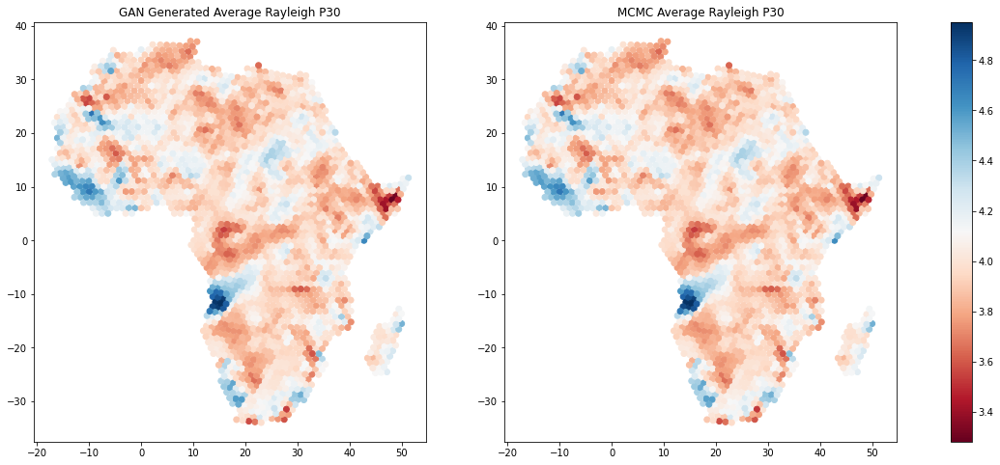

In [6]:
# compute the average of MCMC samples and GAN Generated Samples
avg = np.mean(data,axis=0)
fake_avg = np.mean(fake_data_scaled,axis=0)

# plot 
fig, axes = plt.subplots(1,2,figsize=(20,8))
axes = axes.flatten()
fig_fake = axes[0].scatter(cord[:,0],cord[:,1],c=fake_avg,cmap='RdBu')
axes[0].set_title('GAN Generated Average Rayleigh P30')
fig_real = axes[1].scatter(cord[:,0],cord[:,1],c=avg,cmap='RdBu')
axes[1].set_title('MCMC Average Rayleigh P30')
plt.colorbar(fig_real,ax=axes)

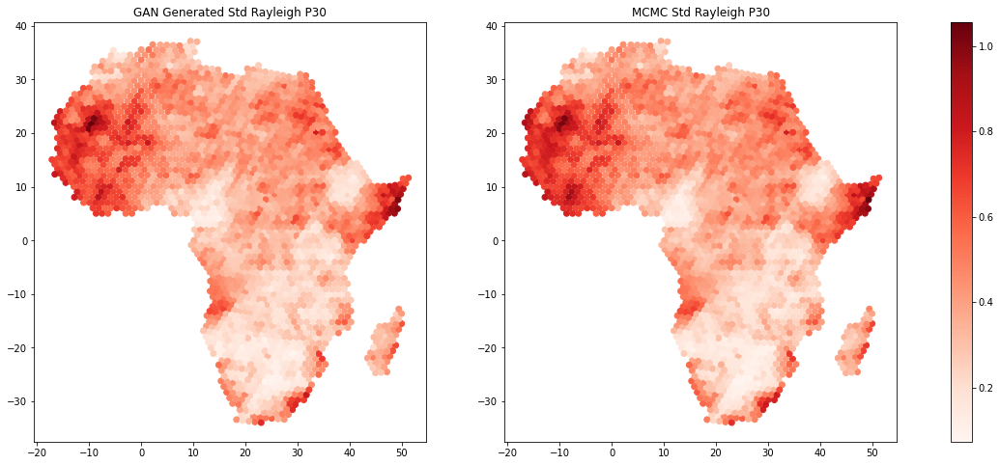

In [7]:
# compute std
real_std = np.std(data,axis=0)
fake_std = np.std(fake_data_scaled,axis=0)

# plot
fig, axes = plt.subplots(1,2,figsize=(20,8))
axes = axes.flatten()
fig_fake = axes[0].scatter(cord[:,0],cord[:,1],c=fake_std,cmap='Reds') 
axes[0].set_title('GAN Generated Std Rayleigh P30')
fig_real = axes[1].scatter(cord[:,0],cord[:,1],c=real_std,cmap='Reds') 
axes[1].set_title('MCMC Std Rayleigh P30') 
plt.colorbar(fig_real,ax=axes)

361 points(15.16%) skewed different direction


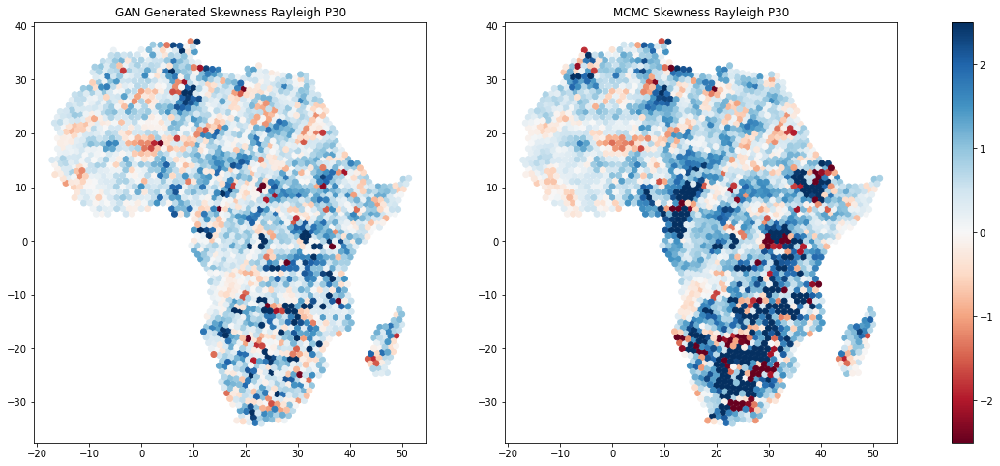

In [8]:
# compute skewness
from scipy.stats import skew
import matplotlib.colors as colors
real_skew = skew(data,axis=0)
fake_skew = skew(fake_data_scaled,axis=0)

# plot
fig, axes = plt.subplots(1,2,figsize=(20,8))
axes = axes.flatten()
normalize = colors.Normalize(vmin=-2.5,vmax=2.5)
fig_fake = axes[0].scatter(cord[:,0],cord[:,1],c=fake_skew,cmap='RdBu',norm=normalize) 
axes[0].set_title('GAN Generated Skewness Rayleigh P30')
fig_real = axes[1].scatter(cord[:,0],cord[:,1],c=real_skew,cmap='RdBu',norm=normalize) 
axes[1].set_title('MCMC Skewness Rayleigh P30') 
plt.colorbar(fig_real,ax=axes)

skew_diff_count = np.sum(fake_skew*real_skew<0)
print("{} points({:.2%}) skewed different direction".format(skew_diff_count, skew_diff_count/data.shape[1]))

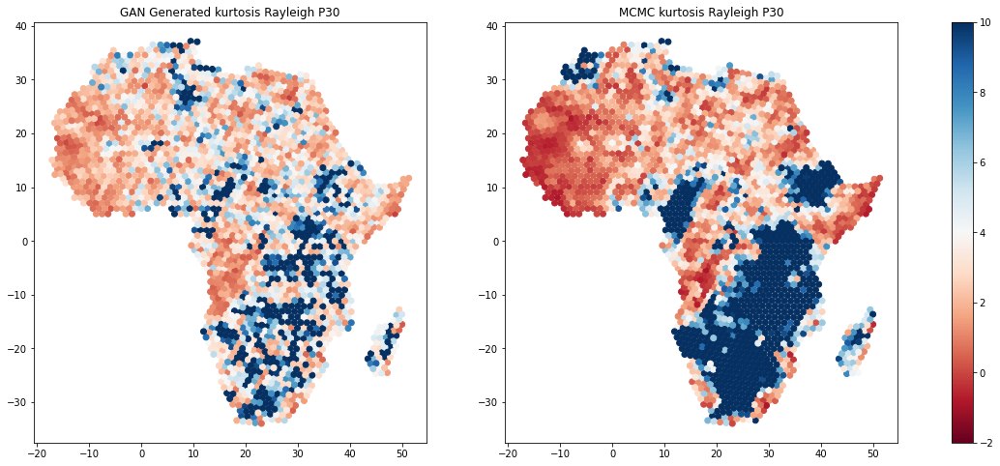

In [9]:
# compute kurtosis
from scipy.stats import kurtosis
real_kurtosis = kurtosis(data,axis=0) 
fake_kurtosis = kurtosis(fake_data_scaled,axis=0)

# plot
fig, axes = plt.subplots(1,2,figsize=(20,8))
axes = axes.flatten()
normalize = colors.Normalize(vmin=-2,vmax=10)
fig_fake = axes[0].scatter(cord[:,0],cord[:,1],c=fake_kurtosis,cmap='RdBu',norm=normalize) 
axes[0].set_title('GAN Generated kurtosis Rayleigh P30')
fig_real = axes[1].scatter(cord[:,0],cord[:,1],c=real_kurtosis,cmap='RdBu',norm=normalize) 
axes[1].set_title('MCMC kurtosis Rayleigh P30') 
plt.colorbar(fig_real,ax=axes)

We use Earth Mover Distance(Wasserstein distance) to measure the distance between the distribution of each points of the generated samples from that of MCMC samples.

In [10]:
from scipy.stats import wasserstein_distance as EMD

# compute the EMD between locations
distance = np.zeros(data.shape[1])
for i in range(data.shape[1]):
    distance[i] = EMD(data[:,i],fake_data_scaled[:,i])

In [11]:
# generate a list of random locations to visualize marginal distributions
location_idxes = np.random.randint(low=0,high=data.shape[1],size=16)

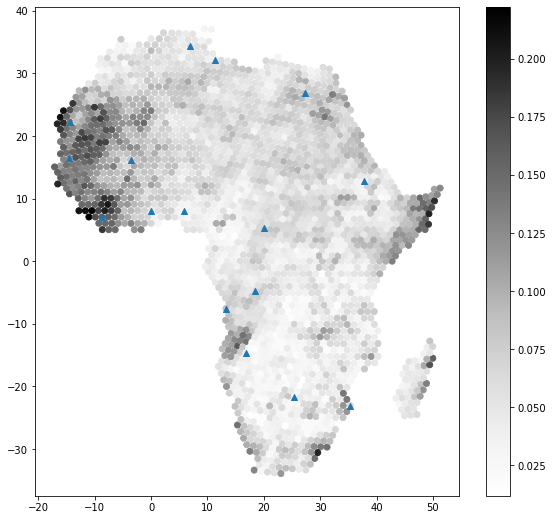

In [12]:
# plot EMD and locations
fig = plt.figure(figsize=(9.5,9))
plt.scatter(cord[:,0],cord[:,1],c=distance,cmap='Greys')
plt.colorbar()
plt.scatter(cord[location_idxes,0],cord[location_idxes,1],marker='^',cmap='RdBu')
plt.show()

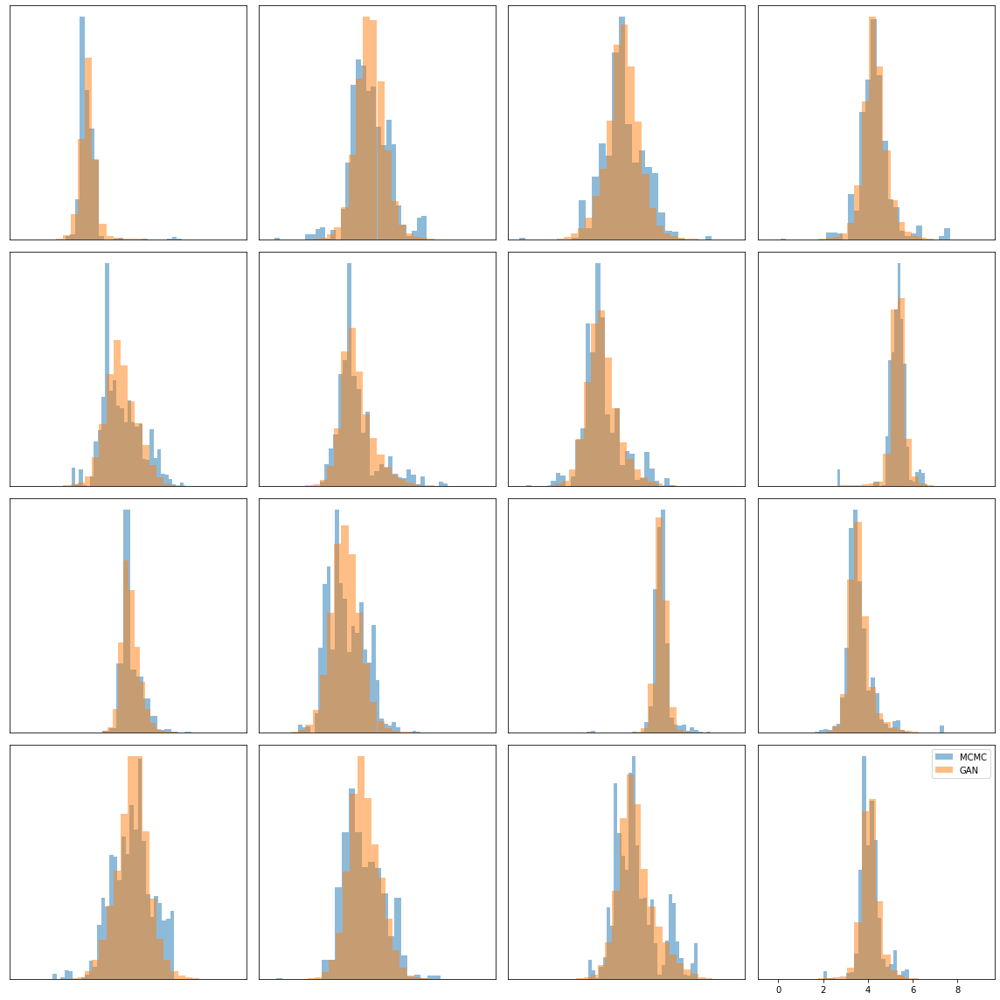

In [13]:
# plot marginals at locations
fig,axes = plt.subplots(4,4,figsize=(16,16))
bins = 30
axes=axes.flatten()
for i,ax in enumerate(axes):
    ax.hist(data[:,location_idxes[i]],bins = 30,density=True,label='MCMC',alpha=0.5)
    ax.hist(fake_data_scaled[:,location_idxes[i]],bins = 30, density=True,label='GAN', alpha=0.5)
    if i != 15: ax.set_xticks([])
    ax.set_yticks([])
plt.legend()
plt.tight_layout()

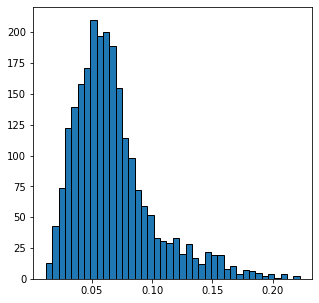

0.34% of points exceeds 0.2 EMD distance


In [14]:
#plot the histogram of EMD
plt.figure(figsize=(5,5))
plt.hist(distance,bins=40,edgecolor="black")
plt.show()
print("{:.2%} of points exceeds 0.2 EMD distance".format(np.sum(distance>0.2)/data.shape[1]))

Evaluate the corvariance relationship

In [15]:
real_cov = np.cov(data.T)
fake_cov = np.cov(fake_data_scaled.T)

687798 pairs (12%) covariate different direction


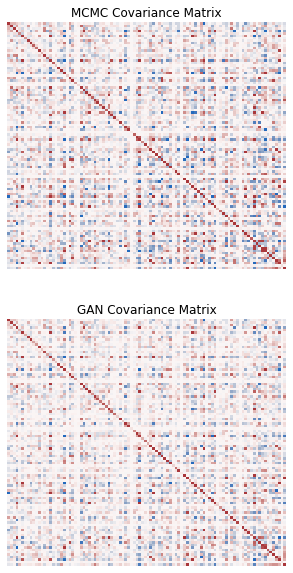

In [16]:
stop = 100

cov_subset = real_cov[:stop,:stop]
cov_subset_fake = fake_cov[:stop,:stop]


fig, axes = plt.subplots(2,1,figsize=(5,10))
axes = axes.flatten()

hm = sns.heatmap(cov_subset,
                 center=0,
                 vmax=0.1,
                 vmin=-0.1,
                 cmap='vlag',ax=axes[0],cbar=False)
axes[0].set_title('MCMC Covariance Matrix')
hm = sns.heatmap(cov_subset_fake,
                 center=0,
                 vmax=0.1,
                 vmin=-0.1,
                 cmap='vlag',ax=axes[1],cbar=False)
axes[1].set_title('GAN Covariance Matrix')
axes[0].axis('off')
axes[1].axis('off')
diff_dire_count = np.sum(fake_cov*real_cov<0)
print("{} pairs ({:.0%}) covariate different direction".format(diff_dire_count,diff_dire_count/(2382*2382)))

# plt.tight_layout()

Text(-290, 10, 'GAN')

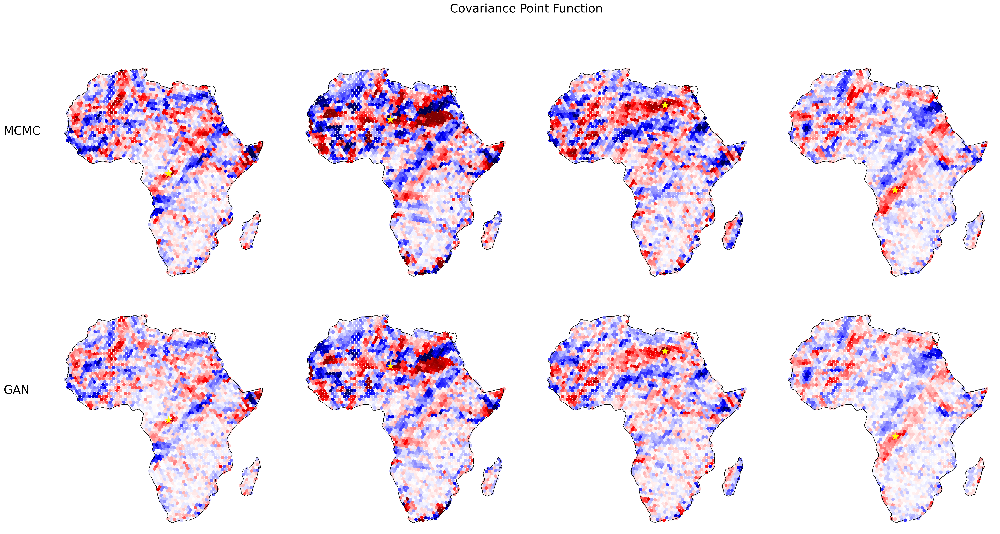

In [ ]:
plt.style.use('default')

# covariance point spread functions
idxes = [2381,100,1000,2000]

fig, axes = plt.subplots(2,4,figsize=(28,15),dpi=300,subplot_kw={'projection': ccrs.PlateCarree()})
shpfile = shapefile_continent(continent="Africa")
triang = tri.Triangulation(cord[:,0],cord[:,1])

for i in range(4):

    axes[0][i].add_geometries(shpfile, crs=ccrs.PlateCarree(), facecolor="None")
    axes[1][i].add_geometries(shpfile, crs=ccrs.PlateCarree(), facecolor="None")

    # plot covariance
    vmin = np.min(real_cov[idxes[i]])
    vmax = np.max(real_cov[idxes[i]])
    s_real = axes[0][i].scatter(cord[:,0],cord[:,1],c=real_cov[idxes[i],:],cmap='seismic',vmin=-0.1,vmax=0.1)
    s_fake = axes[1][i].scatter(cord[:,0],cord[:,1],c=fake_cov[idxes[i],:],cmap='seismic',vmin=-0.1,vmax=0.1)
    # con = axes[0][i].tricontourf(triang,real_cov[idxes[i]],cmap='RdBu',vmin=vmin,vmax=vmax)
    # confake = axes[1][i].tricontourf(triang,fake_cov[idxes[i]],cmap='RdBu',vmin=vmin,vmax=vmax)
    # # plot point
    axes[0][i].scatter(cord[idxes[i],0],cord[idxes[i],1],s=200,marker='*',c='yellow')
    axes[1][i].scatter(cord[idxes[i],0],cord[idxes[i],1],s=200,marker='*',c='yellow')

    # coastline
    # axes[0][i].coastlines(zorder=999)
    # axes[0][i].add_feature(cartopy.feature.OCEAN,zorder = 698, color = 'white')
    # axes[1][i].coastlines(zorder=999)
    # axes[1][i].add_feature(cartopy.feature.OCEAN,zorder = 698, color = 'white')
    

    # turn off axis
    axes[0][i].axis('off')
    axes[1][i].axis('off')

axes[0][0].set_ylabel("MCMC")
axes[1][0].set_ylabel("GAN")

plt.tight_layout(pad=5)
plt.suptitle("Covariance Point Function",y = 1.05,fontsize=24)
plt.text(-290,100,"MCMC",fontsize=24)
plt.text(-290,10,"GAN",fontsize=24)


#### Experimental Figures

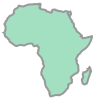

In [99]:
# Obtaining Africa Continent shape
import geopandas as gpd
import cartopy.io.shapereader as shpreader
from shapely.ops import unary_union
from shapely.geometry import Point, Polygon, MultiPolygon

def shapefile_continent(continent="Africa"):
    """Get a single combined shapefile for a specified continent."""
    shpfilename = shpreader.natural_earth(resolution='110m', category='cultural', name='admin_0_countries')
    reader = shpreader.Reader(shpfilename)
    valid_shapes = [record.geometry for record in reader.records() if record.attributes["CONTINENT"] == continent]

    return gpd.GeoSeries(unary_union(valid_shapes))

shpfile = shapefile_continent(continent="Africa")
shpfile[0]

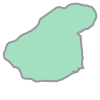

In [151]:
# load cratons and create craton polygon
import scipy.io as sio

cratons = sio.loadmat('./data/AfricanCratons.mat')
cratons = [cratons['Congo'],cratons['Kala'],cratons['Sahara'],cratons['Tanza'],cratons['West'],cratons['Zim']]
craton_polys = [Polygon([Point(point[1],point[0]) for point in c]) for c in cratons]
multiploy = MultiPolygon([poly for poly in craton_polys])
craton_polys[1]

In [103]:
# create scatter point craton mask
def polygon_index(points,polygon):
    in_points = []
    for i in range(len(cord)):
        if Point(points[i,0],points[i,1]).within(polygon):
            in_points.append(i)
    return np.array(in_points)


craton_mask = np.full(len(cord),False)
for i in range(len(cord)):
    for poly in craton_polys:
        if Point(cord[i,0],cord[i,1]).within(poly):
            craton_mask[i] = True; break

In [122]:
# create Africa Continent mask
def mask(grid_x,grid_y,grid_z,polygon):
    for i in range(grid_z.shape[0]):
        for j in range(grid_z.shape[1]):
            if not Point(grid_x[i,j],grid_y[i,j]).within(polygon):
                grid_z[i,j] = np.nan
shpfile = shapefile_continent(continent="Africa")
p1 = Point(17.5330030090457,99)
p1.within(shpfile[0])

False

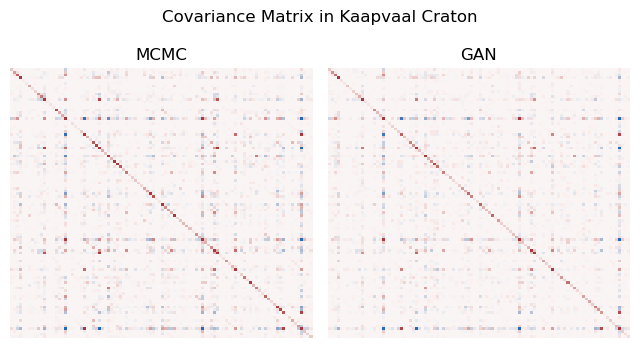

In [152]:
# plot covariance matrix inside cratons
Zim_points = polygon_index(cord,craton_polys[1])
zim_cov_real = np.cov(data[:,Zim_points].T)[:100,:100]
zim_cov_fake = np.cov(fake_data_scaled[:,Zim_points].T)[:100,:100]

fig, axes = plt.subplots(1,2,figsize=(6.5,3.5))
axes = axes.flatten()

hm = sns.heatmap(zim_cov_real,
                 center=0,
                 vmax=0.1,
                 vmin=-0.1,
                 cmap='vlag',ax=axes[0],cbar=False)
axes[0].set_title('MCMC',fontsize = 12)
hm = sns.heatmap(zim_cov_fake,
                 center=0,
                 vmax=0.1,
                 vmin=-0.1,
                 cmap='vlag',ax=axes[1],cbar=False)
axes[1].set_title('GAN',fontsize = 12)
axes[0].axis('off')
axes[1].axis('off')
plt.suptitle("Covariance Matrix in Kaapvaal Craton")
plt.tight_layout()

Text(-290, 10, 'GAN')

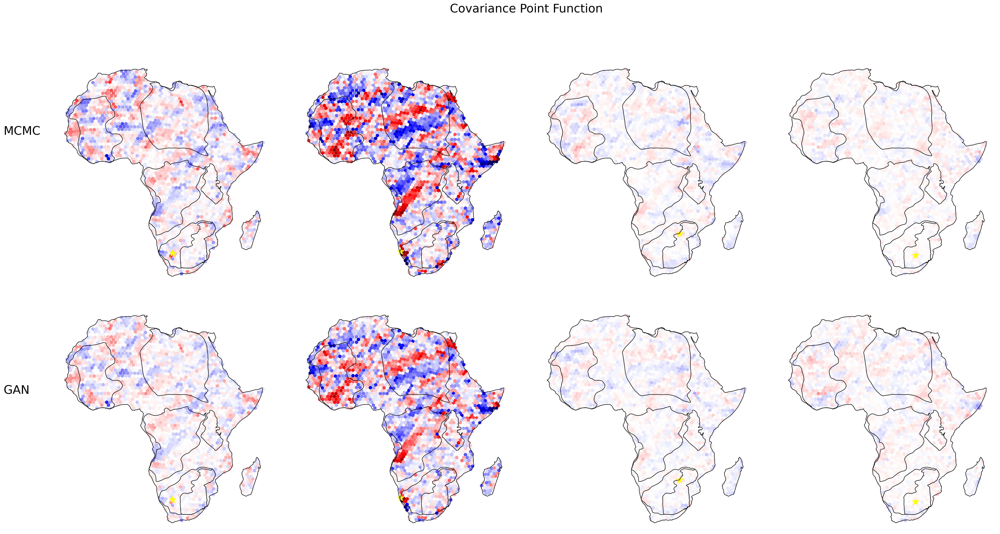

In [246]:
plt.style.use('default')

# covariance point spread functions
Zim_points = polygon_index(cord,craton_polys[1])

fig, axes = plt.subplots(2,4,figsize=(28,15),dpi=300,subplot_kw={'projection': ccrs.PlateCarree()})
shpfile = shapefile_continent(continent="Africa")

for i in range(4):

    axes[0][i].add_geometries(shpfile, crs=ccrs.PlateCarree(), facecolor="None")
    axes[1][i].add_geometries(shpfile, crs=ccrs.PlateCarree(), facecolor="None")
    for craton in cratons:
        axes[0][i].plot(craton[:,1],craton[:,0],color='black',linewidth=1)
        axes[1][i].plot(craton[:,1],craton[:,0],color='black',linewidth=1)

    # plot covariance
    vmin = np.min(real_cov[Zim_points[i+10]])
    vmax = np.max(real_cov[Zim_points[i+10]])
    s_real = axes[0][i].scatter(cord[:,0],cord[:,1],c=real_cov[Zim_points[i+10],:],cmap='seismic',vmin=-0.1,vmax=0.1)
    s_fake = axes[1][i].scatter(cord[:,0],cord[:,1],c=fake_cov[Zim_points[i+10],:],cmap='seismic',vmin=-0.1,vmax=0.1)

    # # plot point
    axes[0][i].scatter(cord[Zim_points[i+10],0],cord[Zim_points[i+10],1],s=200,marker='*',c='yellow')
    axes[1][i].scatter(cord[Zim_points[i+10],0],cord[Zim_points[i+10],1],s=200,marker='*',c='yellow')
    
    # turn off axis
    axes[0][i].axis('off')
    axes[1][i].axis('off')

# axes[0][0].set_ylabel("MCMC")
# axes[1][0].set_ylabel("GAN")

plt.tight_layout(pad=5)
plt.suptitle("Covariance Point Function",y = 1.05,fontsize=24)
plt.text(-290,100,"MCMC",fontsize=24)
plt.text(-290,10,"GAN",fontsize=24)

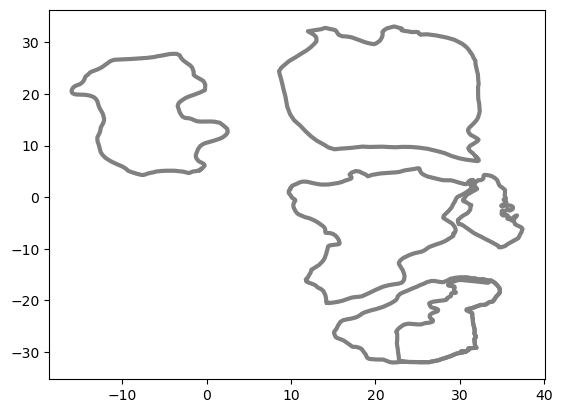

In [242]:
fig,ax = plt.subplots(1,1)
for craton in cratons:
    plt.plot(craton[:,1],craton[:,0],color='grey',linewidth=3)

In [ ]:
from scipy.interpolate import griddata
fig = plt.figure(figsize=(10,10),dpi=300)
grid_x, grid_y = np.meshgrid(np.linspace(-20,60,500),np.linspace(-40,40,500))
points = np.array([cord[:,0],cord[:,1]]).T
grid_z = griddata(points=points,values=real_cov[idxes[0]],xi=(grid_x, grid_y),method='cubic')
mask(grid_x,grid_y,grid_z,shpfile[0])
plt.pcolormesh(grid_x,grid_y,grid_z,cmap='RdBu',vmin=-0.1,vmax=0.1)
print(grid_z[29,125])

/Users/ezhou12/opt/anaconda3/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1728: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = super().pcolormesh(*args, **kwargs)
/Users/ezhou12/opt/anaconda3/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1728: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = super().pcolormesh(*args, **kwargs)


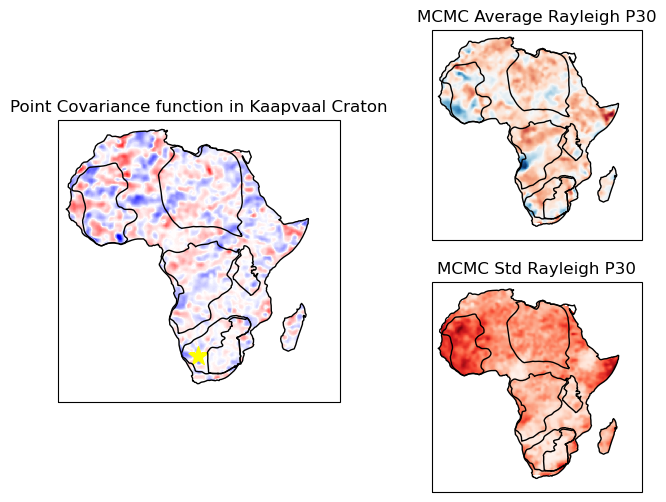

In [278]:
# Summary Figures
from matplotlib.gridspec import GridSpec
gs_kw = GridSpec(2,2)
fig = plt.figure(figsize=(8,6))
axd = {"left": fig.add_subplot(gs_kw[0:,0],projection=ccrs.PlateCarree()),
            "ur": fig.add_subplot(gs_kw[0,1],projection=ccrs.PlateCarree()),
             "lr": fig.add_subplot(gs_kw[1,1],projection=ccrs.PlateCarree())}

# prep grid
grid_x, grid_y = np.meshgrid(np.linspace(-20,60,500),np.linspace(-40,40,500))
points = np.array([cord[:,0],cord[:,1]]).T

# point cov
grid_z = griddata(points=points,values=real_cov[Zim_points[10],:],xi=(grid_x, grid_y),method='cubic')
mask(grid_x,grid_y,grid_z,shpfile[0])
# cov_point_fig = axd['left'].scatter(cord[:,0],cord[:,1],s=10,c=real_cov[Zim_points[0],:],cmap='seismic',vmin=-0.1,vmax=0.1)
cov_point_fig = axd['left'].pcolormesh(grid_x,grid_y,grid_z,cmap='seismic',vmin=-0.1,vmax=0.1)
axd['left'].scatter(cord[Zim_points[10],0],cord[Zim_points[10],1],s=200,marker='*',c='yellow')
# plt.colorbar(cov_point_fig,ax=axd['left'],location='right',shrink=0.5,extend='both',use_gridspec=True)
axd['left'].set_title("Point Covariance function in Kaapvaal Craton")

# axd['left'].axis('off')

# average
grid_z = griddata(points=points,values=avg,xi=(grid_x, grid_y),method='cubic')
mask(grid_x,grid_y,grid_z,shpfile[0])
# average_fig = axd['ur'].scatter(cord[:,0],cord[:,1],s=2,c=avg,cmap='RdBu')
average_fig = axd['ur'].pcolormesh(grid_x,grid_y,grid_z,cmap='RdBu',shading='nearest')
axd['ur'].set_title('MCMC Average Rayleigh P30')
# plt.colorbar(average_fig,ax=axd['ur'],location='right',shrink=0.5)

# std
grid_z = griddata(points=points,values=real_std,xi=(grid_x, grid_y),method='cubic')
mask(grid_x,grid_y,grid_z,shpfile[0])
# std_fig = axd['lr'].scatter(cord[:,0],cord[:,1],s=2,c=real_std,cmap='Reds') 
std_fig = axd['lr'].pcolormesh(grid_x,grid_y,grid_z,cmap='Reds')
axd['lr'].set_title('MCMC Std Rayleigh P30') 
# plt.colorbar(std_fig,ax=axd['lr'],location='right',shrink=0.5)

for k in axd:
    axd[k].add_geometries(shpfile, crs=ccrs.PlateCarree(), facecolor="None")
    for craton in cratons:
        axd[k].plot(craton[:,1],craton[:,0],color='black',linewidth=1)

<AxesSubplot:>

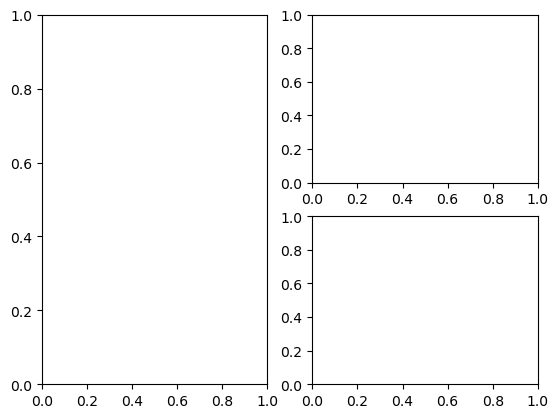

In [262]:
from matplotlib.gridspec import GridSpec
fig = plt.figure()
spec3 = GridSpec(ncols=2, nrows=2)
fig.add_subplot(spec3[0:,0])
fig.add_subplot(spec3[0,1:])
fig.add_subplot(spec3[1:,1:])